# HR Analytics Project- Understanding the Attrition in HR


Project Description
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

HR Analytics
Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

Attrition in HR
Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.
Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.


Dataset Link-
•	https://github.com/dsrscientist/IBM_HR_Attrition_Rate_Analytics


# Data Pre-processing

Data Pre-processing refers to Data Integration, Data Analysis, Data cleaning, Data Transformation, and Dimension Reduction

Data preprocessing is the process of cleaning and preparing the raw data to enable feature engineering

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
hr_df=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')

In [3]:
#showing the first five data
hr_df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
#showing the last five rows
hr_df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


In [5]:
#Showing the number of rows and columns in the datasets
hr_df.shape

(1470, 35)

In the above datasets there are 1470 observations(rows) and 11 variables/features columns in the dataset

In [6]:
#showing the columns details like int, object,  null values in the datsets and also shows the memory usage
hr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [7]:
hr_df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

#In the above datsets there are unique values prersent in the data sets for exp- age-43 unique values, attrition are yes or no values

In [8]:
hr_df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In the above datasets there is no null values

In [9]:
# Finding the percentage of null value in case there is null values in features
(hr_df.isnull().sum()/(len(hr_df)))*100

Age                         0.0
Attrition                   0.0
BusinessTravel              0.0
DailyRate                   0.0
Department                  0.0
DistanceFromHome            0.0
Education                   0.0
EducationField              0.0
EmployeeCount               0.0
EmployeeNumber              0.0
EnvironmentSatisfaction     0.0
Gender                      0.0
HourlyRate                  0.0
JobInvolvement              0.0
JobLevel                    0.0
JobRole                     0.0
JobSatisfaction             0.0
MaritalStatus               0.0
MonthlyIncome               0.0
MonthlyRate                 0.0
NumCompaniesWorked          0.0
Over18                      0.0
OverTime                    0.0
PercentSalaryHike           0.0
PerformanceRating           0.0
RelationshipSatisfaction    0.0
StandardHours               0.0
StockOptionLevel            0.0
TotalWorkingYears           0.0
TrainingTimesLastYear       0.0
WorkLifeBalance             0.0
YearsAtC

<AxesSubplot:>

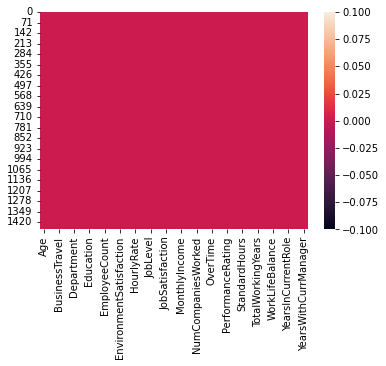

In [10]:
#lets visualize it using heatmap for null values
sns.heatmap(hr_df.isnull())

# Data Reduction

In this datasets there is no need to drop the columns becuse all the datas are correct

# Feature Engineering¶

Feature engineering refers to the process of using domain knowledge to select and transform the most relevant variables from raw data when creating a predictive model using machine learning or statistical modeling. The main goal of Feature engineering is to create meaningful data from raw data.

All the data are meaningful data

# Data Cleaning/Wrangling

Some names of the variables are not relevant and not easy to understand. Some data may have data entry errors, and some variables may need data type conversion. We need to fix this issue in the data.

All the datas are relevent to and easy to understand, there is no data entry error in this dataframe and also there is no need to convert the variable data

here it is done the fundamental data analysis, Featuring, and data clean-up. Let’s move to the EDA process

# EDA Exploratory Data Analysis

Exploratory Data Analysis refers to the crucial process of performing initial investigations on data to discover patterns to check assumptions with the help of summary statistics and graphical representations.

EDA can be leveraged to check for outliers, patterns, and trends in the given data.

EDA helps to find meaningful patterns in data.

EDA provides in-depth insights into the data sets to solve our business problems.

EDA gives a clue to impute missing values in the dataset

# Statistics Summary

The information gives a quick and simple description of the data.

Can include Count, Mean, Standard Deviation, median, mode, minimum value, maximum value, range, standard deviation, etc.

Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [11]:
hr_df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


#The Count shows there is no null values beacuse all the columns are same values

#Stad Deviation #min - miniumum value of all the values #25% -Quartile -1st quartile

#50% -Quartile- and its also say median -2nd quartile

#75% -Quaratile -3rd quartile

#Max - are largest value

#Mean is less than the median it means your data is left escape

#mean is greater than median then it means your data is right escaped

Education,- Mean is more than the median value it means data shows as left escape 

Age, Distance from home, Emp number, - Mean is less than the median value it means that data shoes the right escaped

Age, Dialy rate, Distance from home, Employeenumber,Hourly rate,Total working years - colums Max values are more than the 3rd quartile(75% percentile ) it shows the outliers are present in the columns

The mean age of the employee is 36.92 years, Environmental satisification-2.72 etc

Before we do EDA, lets separate Numerical and categorical variables for easy analysis- in case nay numerical and categorical values are there

In [12]:
#Separting Numerical and categorical column

categorical_col = []
for i in hr_df.dtypes.index:
    if hr_df.dtypes[i] == "object":     #dtypes[i]-dtypes of any columns object it will append that columns in empty list 
        categorical_col.append(i)    #append method is used to add the value in your existing list
print("Categorical Columns:", categorical_col)
print("\n")

#Checking for Numerical columns
#Explanatory mark is used for not- when the condition my datatype is not object in that time  
#cont--is not satisifed in that time it append the numerical list
numerical_col = []        #creating empty list
for i in hr_df.dtypes.index:
    if hr_df.dtypes[i]!='object':      
        numerical_col.append(i)
print("Numerical Columns:", numerical_col)

Categorical Columns: ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']


Numerical Columns: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


# Data Visualization

# EDA Univariate Analysis

Text(0.5, 1.0, 'Number of attrition report by education field')

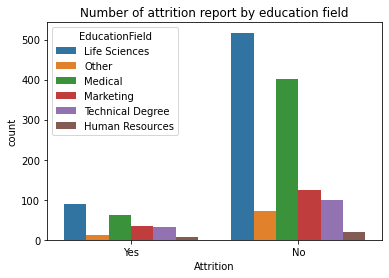

In [13]:
sns.countplot(x='Attrition', hue='EducationField' ,data=hr_df).set_title('Number of attrition report by education field')

From the above graph show the number of attritions report by education feild, it shows thatmarketing, Techinical degree and Human Resourses feild makes small proportion of the datasets, the proportion of the attrited employees are heigher.

In [14]:
#hr_df[hr_df["Attrition"] == 1].groupby(["EducationField"]).size() / hr_df.groupby(["EducationField"]).size()

Text(0.5, 1.0, 'Number of attrition report by BusinessTravel')

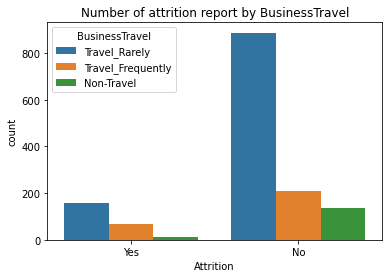

In [15]:
sns.countplot(x='Attrition', hue='BusinessTravel' ,data=hr_df).set_title('Number of attrition report by BusinessTravel')

from the above graph show the Business Travel person are attriated heigh

Text(0.5, 1.0, 'Number of attrition report by Department')

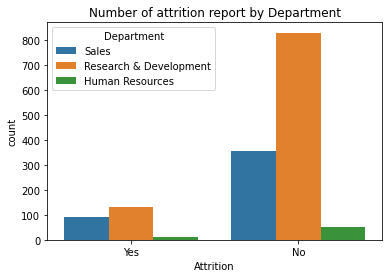

In [16]:
sns.countplot(x='Attrition', hue='Department' ,data=hr_df).set_title('Number of attrition report by Department')

From the above graph show the number of attritions report by education feild, it shows Sales, Research & development and Human Resourses feild makes small proportion of the datasets, the proportion of the attrited employees are heigher in Reseach & Development.

Text(0.5, 1.0, 'Number of attrition report by Gender')

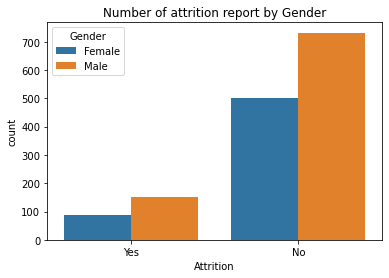

In [17]:
sns.countplot(x='Attrition', hue='Gender' ,data=hr_df).set_title('Number of attrition report by Gender')

The above graph show that about 250 employee departed from the company while around 1200 employee stayed. In that departed enployess large proportion is male employee

Text(0.5, 1.0, 'Number of attrition report by JobRole')

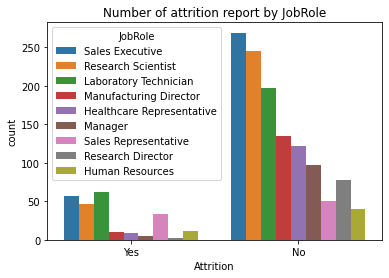

In [18]:
sns.countplot(x='Attrition', hue='JobRole' ,data=hr_df).set_title('Number of attrition report by JobRole')

From the above graph the attried employees are Sale executive, Research scientiest, Lab Techinician

Text(0.5, 1.0, 'Number of attrition report by MaritalStatus')

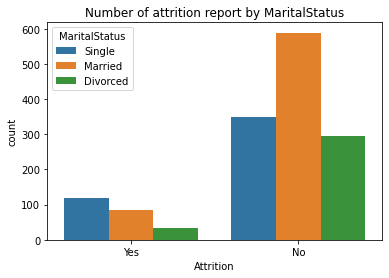

In [19]:
sns.countplot(x='Attrition', hue='MaritalStatus' ,data=hr_df).set_title('Number of attrition report by MaritalStatus')

From the above grah show the single are highest attrited employee

35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64


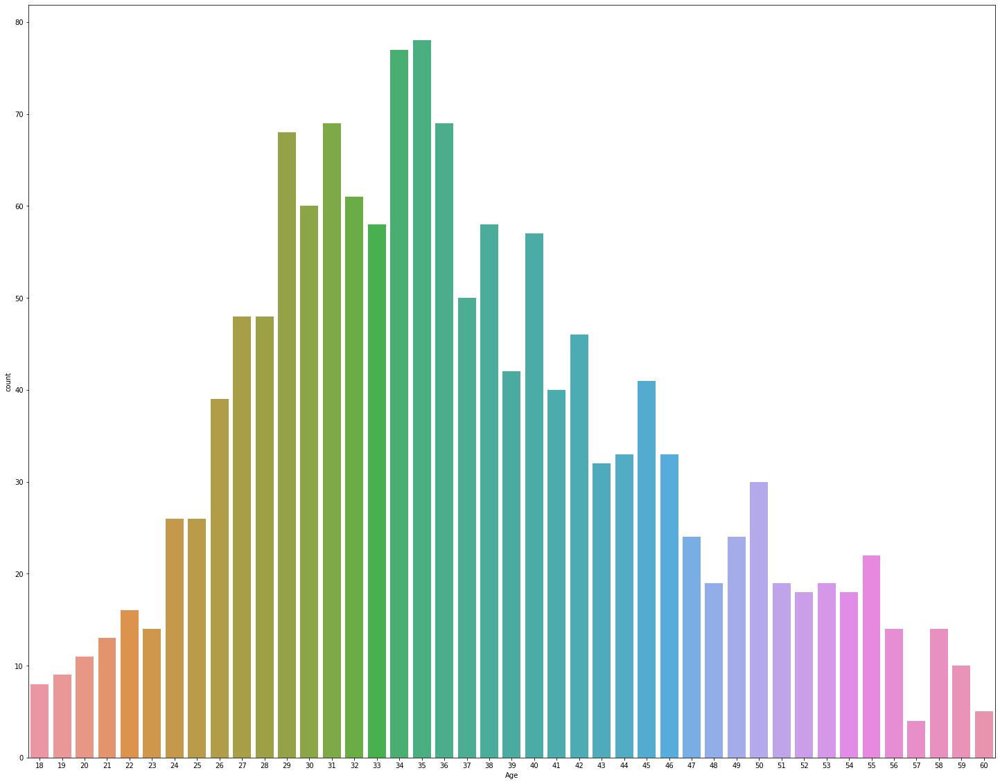

In [20]:
plt.figure(figsize = (25, 20))
ax = sns.countplot(x='Age',data=hr_df)
print(hr_df['Age'].value_counts())

Age 35 & 34 are highest number of count

3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


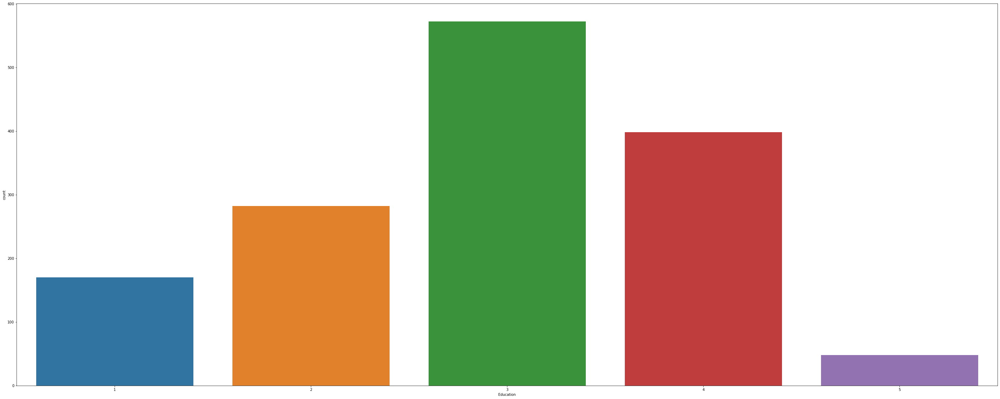

In [21]:
plt.figure(figsize = (50, 20))
ax = sns.countplot(x='Education',data=hr_df)
print(hr_df['Education'].value_counts())

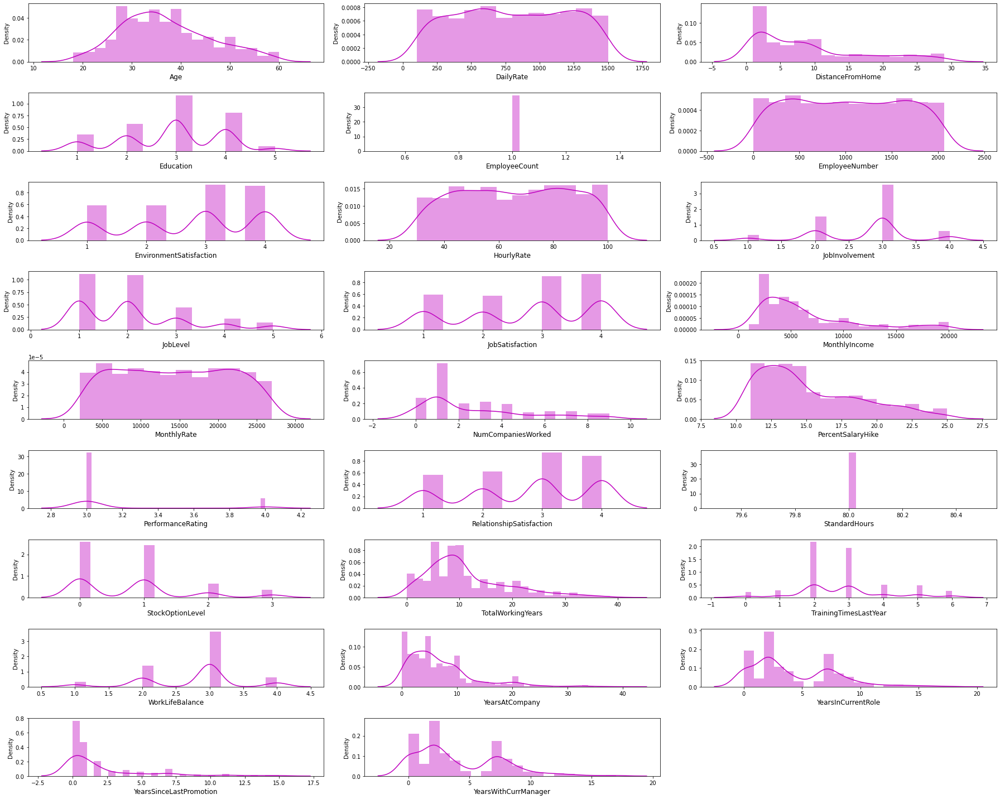

In [22]:
plt.figure(figsize = (25, 20), facecolor = "white")
plotnumber = 1
for col in numerical_col:   # for col using numerical_col
    if plotnumber<=26:       #pltnumber is less than four equal to 4 each grap we are using four plot
        ax = plt.subplot(9, 3, plotnumber) #number of plot in given dimenstion using subplot 
        sns.distplot(hr_df[col], color = "m") #plt colour for columns
        plt.xlabel(col, fontsize = 12)
        plt.yticks(rotation = 0, fontsize =10)
    plotnumber+=1
plt.tight_layout()

# Bivariate Analysis

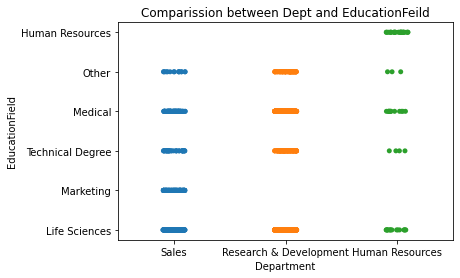

In [23]:
# Comparing 
plt.title("Comparission between Dept and EducationFeild")
sns.stripplot(x="Department", y= "EducationField", data = hr_df)
plt.show()

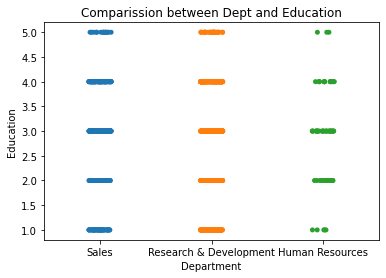

In [24]:
# Comparing 
plt.title("Comparission between Dept and Education")
sns.stripplot(x="Department", y= "Education", data = hr_df)
plt.show()

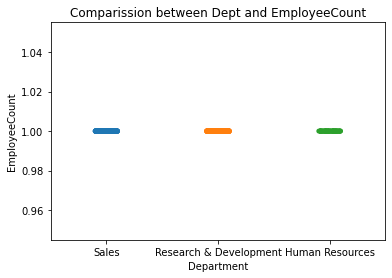

In [25]:
# Comparing 
plt.title("Comparission between Dept and EmployeeCount")
sns.stripplot(x="Department", y= "EmployeeCount", data = hr_df)
plt.show()

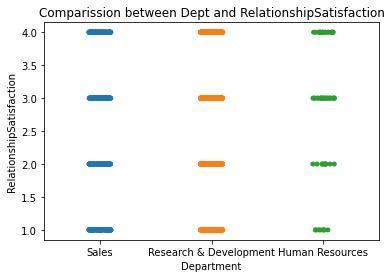

In [26]:
plt.title("Comparission between Dept and RelationshipSatisfaction")
sns.stripplot(x="Department", y= "RelationshipSatisfaction", data = hr_df)
plt.show()

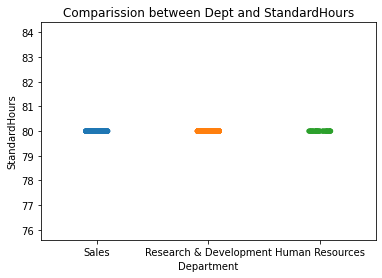

In [27]:
plt.title("Comparission between Dept and StandardHours")
sns.stripplot(x="Department", y= "StandardHours", data = hr_df)
plt.show()

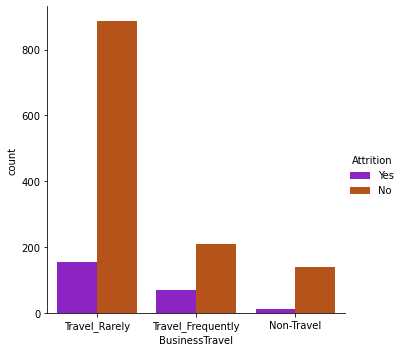

In [28]:
#cheking the Attrition levl in BusinessTravel
sns.catplot(x = 'BusinessTravel', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

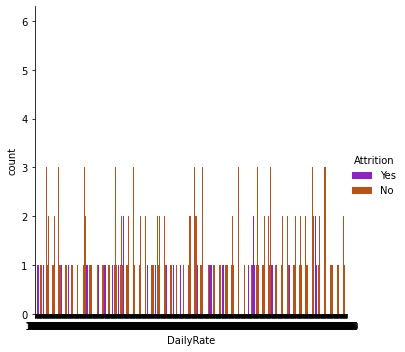

In [29]:
#cheking the Attrition levl in DailyRate
sns.catplot(x = 'DailyRate', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

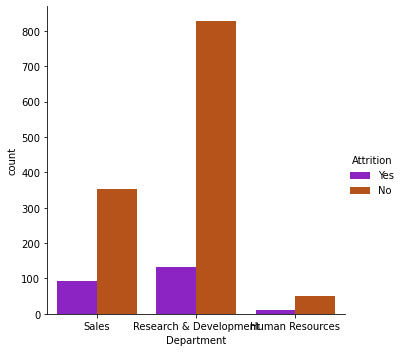

In [30]:
#cheking the Attrition levl in Department
sns.catplot(x = 'Department', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

<Figure size 3600x7200 with 0 Axes>

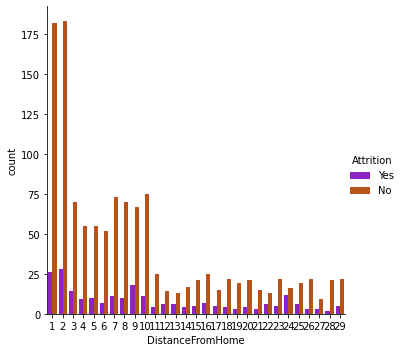

In [31]:
#cheking the Attrition levl in DistanceFromHome
plt.figure(figsize = (50, 100))
sns.catplot(x = 'DistanceFromHome', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

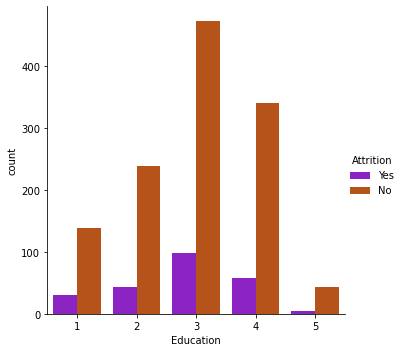

In [32]:
#cheking the Attrition levl in Education

sns.catplot(x = 'Education', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

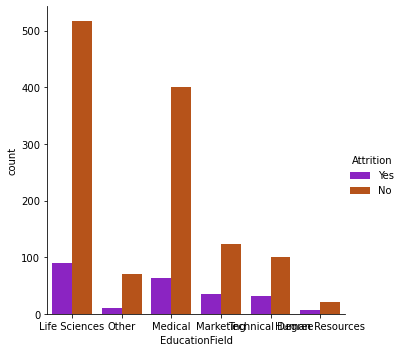

In [33]:
#cheking the Attrition levl in EducationField

sns.catplot(x = 'EducationField', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

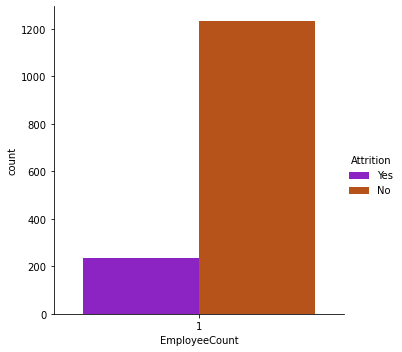

In [34]:
#cheking the Attrition levl in EmployeeCount

sns.catplot(x = 'EmployeeCount', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

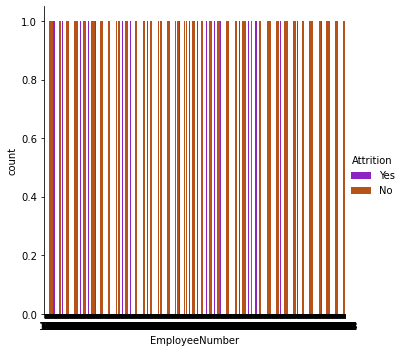

In [35]:
#cheking the Attrition levl in EmployeeNumber

sns.catplot(x = 'EmployeeNumber', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

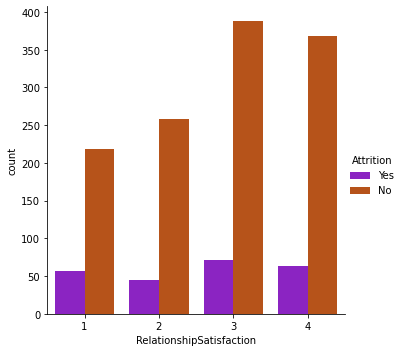

In [36]:
#cheking the Attrition levl in RelationshipSatisfaction

sns.catplot(x = 'RelationshipSatisfaction', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

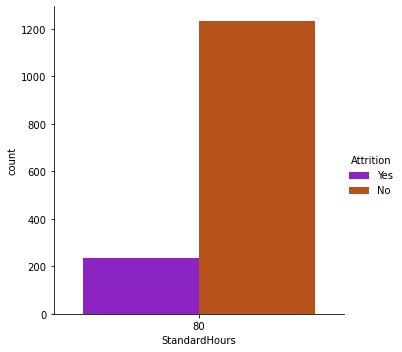

In [37]:
#cheking the Attrition levl in StandardHours

sns.catplot(x = 'StandardHours', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

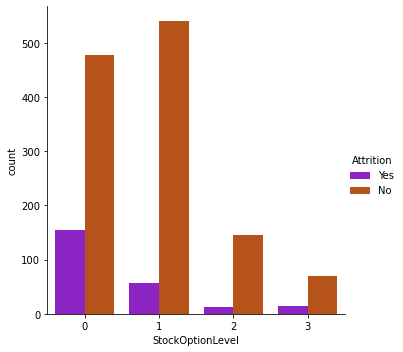

In [38]:
#cheking the Attrition levl in StockOptionLevel

sns.catplot(x = 'StockOptionLevel', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

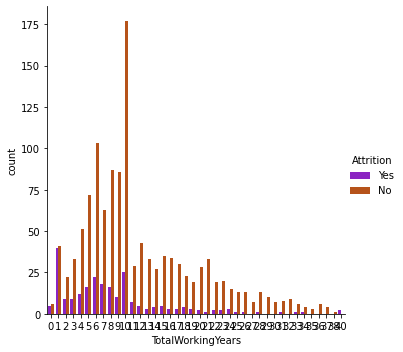

In [39]:
#cheking the Attrition levl in TotalWorkingYears

sns.catplot(x = 'TotalWorkingYears', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

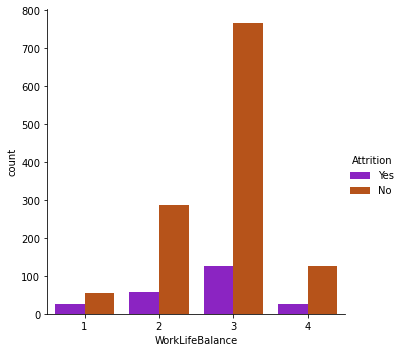

In [40]:
#cheking the Attrition levl in WorkLifeBalance

sns.catplot(x = 'WorkLifeBalance', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

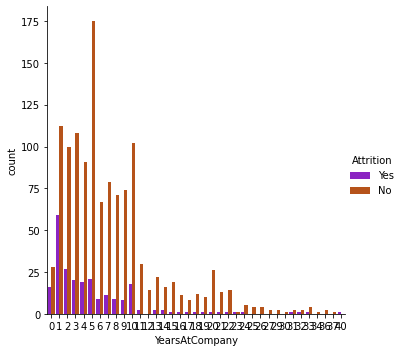

In [41]:
#cheking the Attrition levl in YearsAtCompany	

sns.catplot(x = 'YearsAtCompany', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

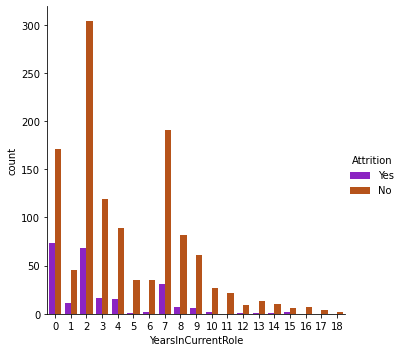

In [42]:
#cheking the Attrition levl in YearsInCurrentRole

sns.catplot(x = 'YearsInCurrentRole', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

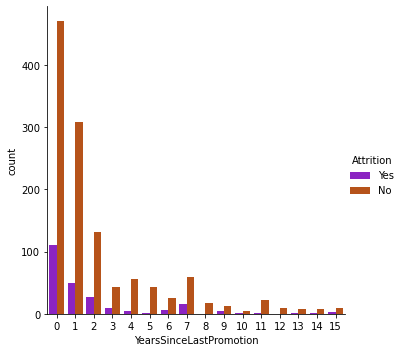

In [43]:
#cheking the Attrition levl in YearsSinceLastPromotion

sns.catplot(x = 'YearsSinceLastPromotion', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

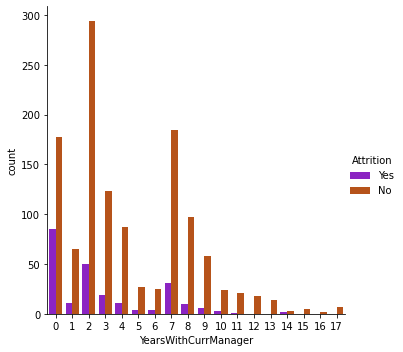

In [44]:
#cheking the Attrition levl in YearsWithCurrManager

sns.catplot(x = 'YearsWithCurrManager', hue= 'Attrition', palette = "gnuplot", kind = "count", data = hr_df)
plt.show()

# Multivariate Analysis

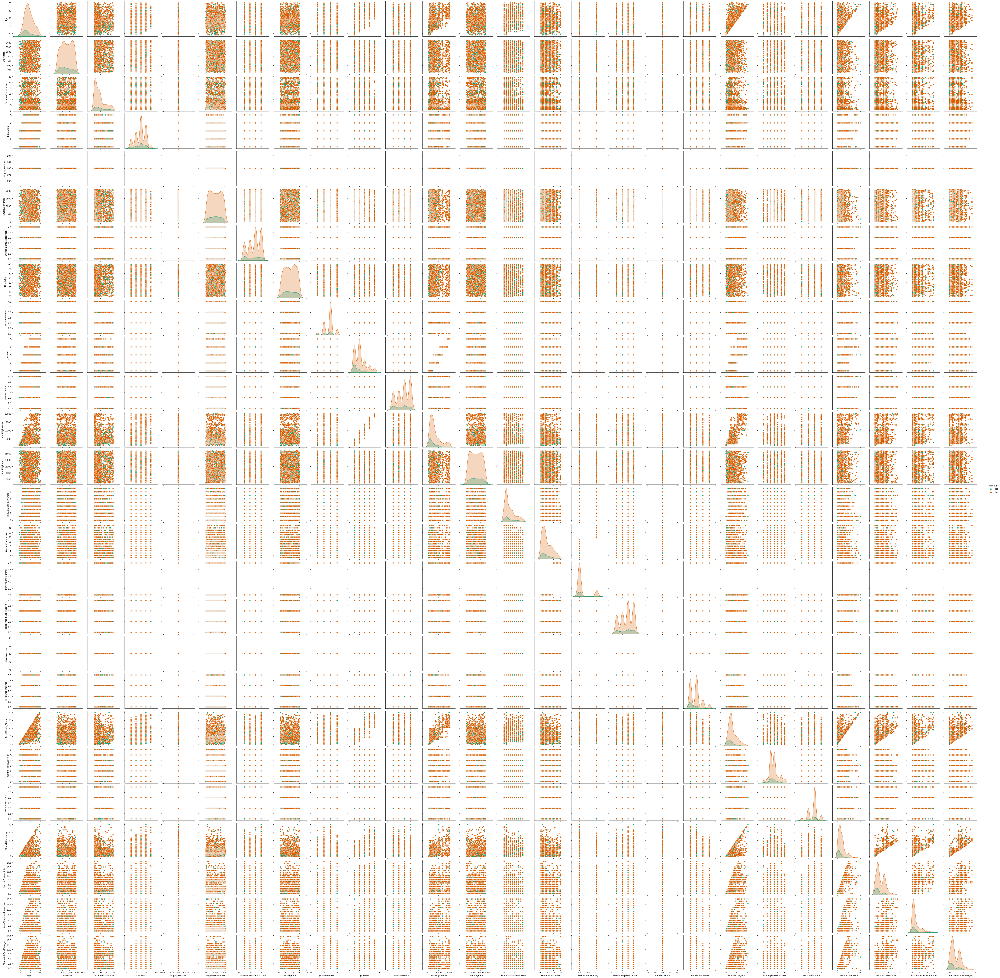

In [45]:
#for more than two coloumns using multivariate
sns.pairplot(hr_df, hue="Attrition", palette="Dark2")
plt.show()

# Checking for Outliers

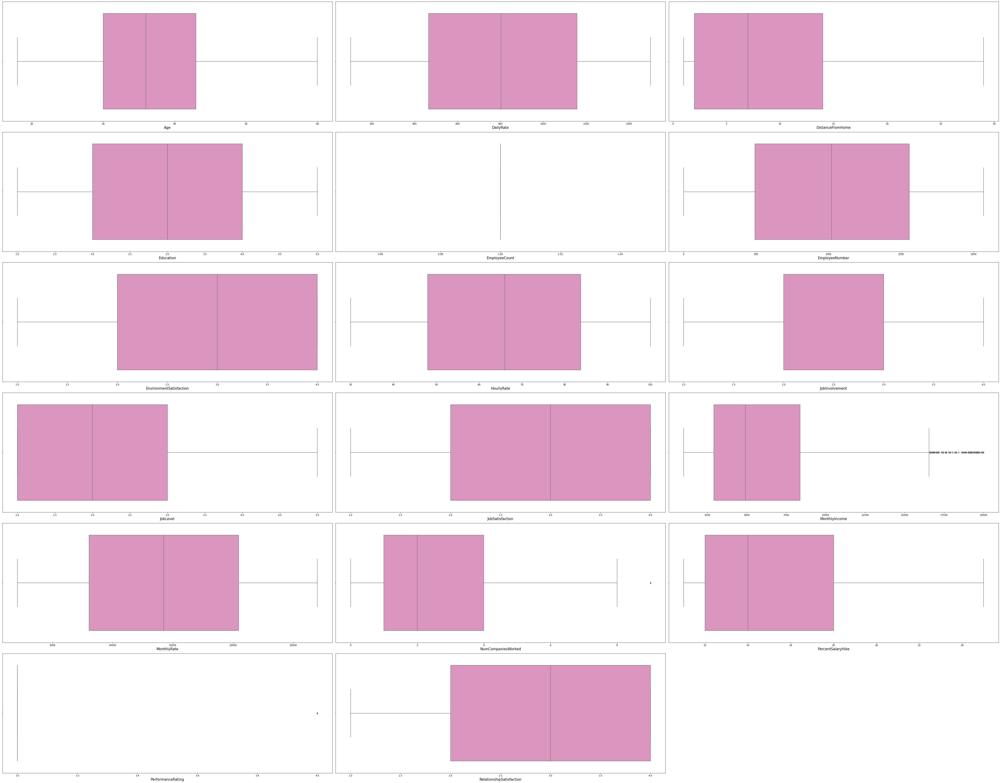

In [46]:
#lets check  the outliers by plotting boxplot.
#to detect the outlers using inter Quartile method
plt.figure(figsize=(60, 70), facecolor="white")
plotnumber=1
for col in numerical_col:
    if plotnumber<=17:
        ax=plt.subplot(9, 3, plotnumber)
        sns.boxplot(hr_df[col], palette= "Set2_r")
        plt.xlabel(col, fontsize = 15)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber+=1
plt.tight_layout()

# Checking for Skewness

In [47]:
#The skewness value is less than +0.5 to -0.5 is the acceptable range
hr_df.skew()

Age                         0.413286
DailyRate                  -0.003519
DistanceFromHome            0.958118
Education                  -0.289681
EmployeeCount               0.000000
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobSatisfaction            -0.329672
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StandardHours               0.000000
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     1.984290
YearsWithCurrManager        0.833451
dtype: float64

In [48]:
#Removing skewness using cuberoot method
hr_df['DistanceFromHome']=np.cbrt(hr_df['DistanceFromHome'])
hr_df['JobLevel']=np.cbrt(hr_df['JobLevel'])
hr_df['MonthlyIncome']=np.cbrt(hr_df['MonthlyIncome'])
hr_df['NumCompaniesWorked']=np.cbrt(hr_df['NumCompaniesWorked'])
hr_df['PerformanceRating']=np.cbrt(hr_df['PerformanceRating'])
hr_df['TotalWorkingYears']=np.cbrt(hr_df['TotalWorkingYears'])
hr_df['YearsSinceLastPromotion']=np.cbrt(hr_df['YearsSinceLastPromotion'])
hr_df['YearsAtCompany']=np.cbrt(hr_df['YearsAtCompany'])



In [49]:
hr_df.skew()

Age                         0.413286
DailyRate                  -0.003519
DistanceFromHome            0.186998
Education                  -0.289681
EmployeeCount               0.000000
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    0.460775
JobSatisfaction            -0.329672
MonthlyIncome               0.677032
MonthlyRate                 0.018578
NumCompaniesWorked         -0.699002
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StandardHours               0.000000
StockOptionLevel            0.968980
TotalWorkingYears          -0.395296
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany             -0.367351
YearsInCurrentRole          0.917363
YearsSinceLastPromotion     0.198634
YearsWithCurrManager        0.833451
dtype: float64

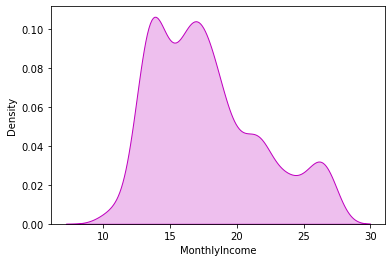

In [50]:
#lets visualize how the data has been ditsributed in total charges after removing skewness
sns.distplot(hr_df['MonthlyIncome'], color="m", kde_kws={"shade":True}, hist = False)
plt.show()

# Encoding categorical columns

In [51]:
#different Encoding method are their using this method u can use- label, ordinal,hotencoder, pandas dot get them method 
#Encoding categorical columns using Ordinal Encoder
#OE -Ordinal Encoder -OE is variable name
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in hr_df.columns:   #using for loop itrating through the columns
    if hr_df[i].dtypes=='object':   #and if the datatypes is object
        hr_df[i] = OE.fit_transform(hr_df[i].values.reshape(-1, 1)) #i am using ordinal encoder to fit transformation after that i am using the reshapping the value
hr_df

# we directly using the code for coverting the string vaue into numerical vaue using encoding method

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1.0,2.0,1102,2.0,1.000000,2,1.0,1,1,...,1,80,0,2.000000,0,1,1.817121,4,0.000000,5
1,49,0.0,1.0,279,1.0,2.000000,1,1.0,1,2,...,4,80,1,2.154435,3,3,2.154435,7,1.000000,7
2,37,1.0,2.0,1373,1.0,1.259921,2,4.0,1,4,...,2,80,0,1.912931,3,3,0.000000,0,0.000000,0
3,33,0.0,1.0,1392,1.0,1.442250,4,1.0,1,5,...,3,80,0,2.000000,3,3,2.000000,7,1.442250,0
4,27,0.0,2.0,591,1.0,1.259921,1,3.0,1,7,...,4,80,1,1.817121,3,3,1.259921,2,1.259921,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0.0,1.0,884,1.0,2.843867,2,3.0,1,2061,...,3,80,1,2.571282,3,3,1.709976,2,0.000000,3
1466,39,0.0,2.0,613,1.0,1.817121,1,3.0,1,2062,...,1,80,1,2.080084,5,3,1.912931,7,1.000000,7
1467,27,0.0,2.0,155,1.0,1.587401,3,1.0,1,2064,...,2,80,1,1.817121,0,3,1.817121,2,0.000000,3
1468,49,0.0,1.0,1023,2.0,1.259921,3,3.0,1,2065,...,4,80,0,2.571282,3,2,2.080084,6,0.000000,8


we have converted the categrical columns into numerical columns using Ordinal Encoding method

In [52]:
hr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   float64
 2   BusinessTravel            1470 non-null   float64
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   float64
 5   DistanceFromHome          1470 non-null   float64
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   float64
 8   EmployeeCount             1470 non-null   int64  
 9   EmployeeNumber            1470 non-null   int64  
 10  EnvironmentSatisfaction   1470 non-null   int64  
 11  Gender                    1470 non-null   float64
 12  HourlyRate                1470 non-null   int64  
 13  JobInvolvement            1470 non-null   int64  
 14  JobLevel

n the above information all the data are float/integer type before there is a objective value

In [53]:
#Statistical summary of numerical
hr_df.describe()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.161224,1.607483,802.485714,1.260544,1.898357,2.912925,2.247619,1.0,1024.865306,...,2.712245,80.0,0.793878,2.112394,2.799320,2.761224,1.742334,4.229252,0.848611,4.123129
std,9.135373,0.367863,0.665455,403.509100,0.527792,0.636163,1.024165,1.331369,0.0,602.024335,...,1.081209,0.0,0.852077,0.550542,1.289271,0.706476,0.585822,3.623137,0.764768,3.568136
min,18.000000,0.000000,0.000000,102.000000,0.000000,1.000000,1.000000,0.000000,1.0,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,1.000000,465.000000,1.000000,1.259921,2.000000,1.000000,1.0,491.250000,...,2.000000,80.0,0.000000,1.817121,2.000000,2.000000,1.442250,2.000000,0.000000,2.000000
50%,36.000000,0.000000,2.000000,802.000000,1.000000,1.912931,3.000000,2.000000,1.0,1020.500000,...,3.000000,80.0,1.000000,2.154435,3.000000,3.000000,1.709976,3.000000,1.000000,3.000000
75%,43.000000,0.000000,2.000000,1157.000000,2.000000,2.410142,4.000000,3.000000,1.0,1555.750000,...,4.000000,80.0,1.000000,2.466212,3.000000,3.000000,2.080084,7.000000,1.442250,7.000000
max,60.000000,1.000000,2.000000,1499.000000,2.000000,3.072317,5.000000,5.000000,1.0,2068.000000,...,4.000000,80.0,3.000000,3.419952,6.000000,4.000000,3.419952,18.000000,2.466212,17.000000


After Encoding the categorical columns we can see all column details here. The Counts of all the columns are same taht means no null values in the datset This describemethod describe the count, mean,st,min,IQR, and max values of all the columns

# Correlation Between target varuiable and Independent variable

In [54]:
#cheking the correlation between feature and target
#cor -correlation
cor = hr_df.corr()
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.017521,0.208034,-0.040873,NaN,-0.010145,...,0.053535,NaN,0.037510,0.670212,-0.019621,-0.021490,0.277599,0.212901,0.178217,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.079090,-0.031373,0.026846,NaN,-0.010577,...,-0.045872,NaN,-0.137145,-0.220336,-0.059478,-0.063939,-0.190852,-0.160545,-0.055223,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.012196,0.000757,0.023724,NaN,-0.015578,...,-0.035986,NaN,-0.016727,0.045264,0.015240,-0.011256,-0.002484,-0.011497,-0.030144,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.003634,-0.016806,0.037709,NaN,-0.050990,...,0.007846,NaN,0.042143,0.023035,0.002453,-0.037848,-0.011387,0.009932,-0.038943,-0.026363
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.026189,0.007996,0.013720,NaN,-0.010895,...,-0.022414,NaN,-0.012193,-0.008491,0.036875,0.026383,0.011446,0.056315,0.018416,0.034282
DistanceFromHome,-0.017521,0.079090,-0.012196,-0.003634,0.026189,1.000000,0.019881,0.007214,NaN,0.035129,...,0.009052,NaN,0.032735,-0.001288,-0.022502,-0.024142,0.009052,0.010556,0.001563,0.015118
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.019881,1.000000,-0.039592,NaN,0.042070,...,-0.009118,NaN,0.018422,0.170609,-0.025100,0.009819,0.061038,0.060236,0.030448,0.069065
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.007214,-0.039592,1.000000,NaN,-0.002516,...,-0.004378,NaN,-0.016185,-0.016817,0.049195,0.041191,-0.006638,-0.010506,0.010138,-0.004130
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeNumber,-0.010145,-0.010577,-0.015578,-0.050990,-0.010895,0.035129,0.042070,-0.002516,NaN,1.000000,...,-0.069861,NaN,0.062227,-0.003171,0.023603,0.010309,0.008860,-0.008416,0.009250,-0.009197


This gives the correlation between the dependent and independent variables. WE can Visualize this by plotting heatmap

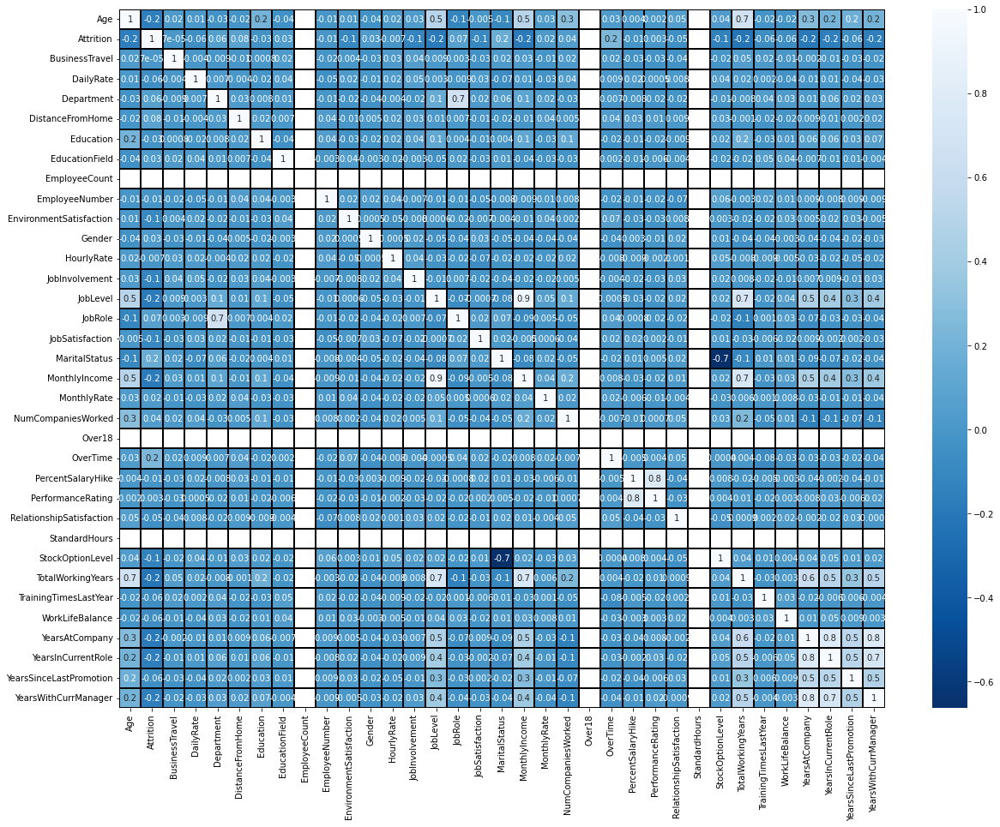

In [55]:
#Visualizing the correlation matrix by plotting heatmap
#for 2nd line again using corr linewidth, fmt-is the how many decimal value should be present
#annot=True is the the grap value will show in the white colours, 
#in casse Annot=False The grap value will shows in the same color it will not show it show s the same colour
plt.figure(figsize = (20, 15))
sns.heatmap(hr_df.corr(), linewidth = 0.1, fmt = ".1g", linecolor ="black", annot = True, cmap = "Blues_r")
plt.yticks(rotation= 0);
plt.show()

In [56]:
hr_df['EmployeeCount'].nunique()

1

In [57]:
cor['Attrition'].sort_values(ascending= False)

Attrition                   1.000000
OverTime                    0.246118
MaritalStatus               0.162070
DistanceFromHome            0.079090
JobRole                     0.067151
Department                  0.063991
NumCompaniesWorked          0.044984
Gender                      0.029453
EducationField              0.026846
MonthlyRate                 0.015170
PerformanceRating           0.002889
BusinessTravel              0.000074
HourlyRate                 -0.006846
EmployeeNumber             -0.010577
PercentSalaryHike          -0.013478
Education                  -0.031373
RelationshipSatisfaction   -0.045872
YearsSinceLastPromotion    -0.055223
DailyRate                  -0.056652
TrainingTimesLastYear      -0.059478
WorkLifeBalance            -0.063939
EnvironmentSatisfaction    -0.103369
JobSatisfaction            -0.103481
JobInvolvement             -0.130016
StockOptionLevel           -0.137145
YearsWithCurrManager       -0.156199
Age                        -0.159205
Y

# Visualizing the correlation between label and feature using bar plot

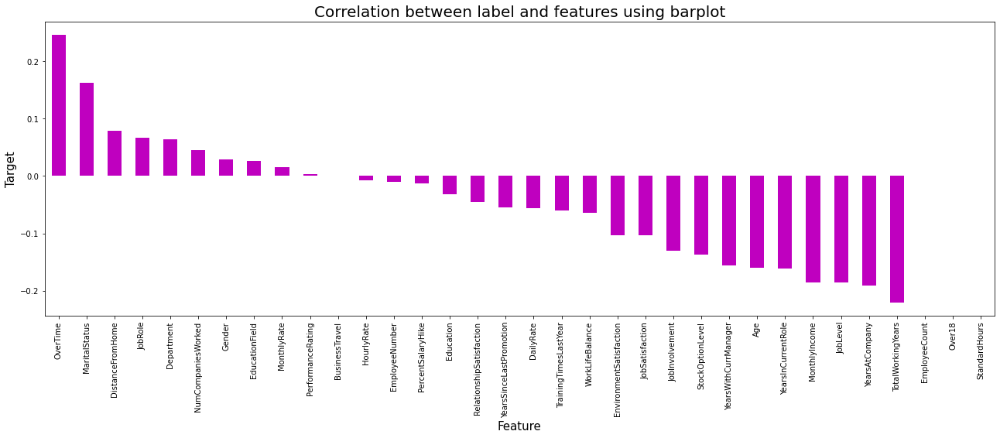

In [58]:
plt.figure(figsize = (22, 7))
hr_df.corr()['Attrition'].sort_values(ascending = False).drop(['Attrition']).plot(kind='bar',color="m")
plt.xlabel('Feature', fontsize = 15)
plt.ylabel('Target', fontsize = 15)
plt.title("Correlation between label and features using barplot", fontsize=20)
plt.show()

# Separting the features and label

In [61]:
#feature is independent variable
#label means target variable
#removing the churn from the remaing columns
#X variable will have independent variables
#Y variable will have - stoing are churn variable
x = hr_df.drop("Attrition", axis = 1)
y = hr_df["Attrition"]

In [64]:
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,2.0,1102,2.0,1.000000,2,1.0,1,1,2,...,1,80,0,2.000000,0,1,1.817121,4,0.000000,5
1,49,1.0,279,1.0,2.000000,1,1.0,1,2,3,...,4,80,1,2.154435,3,3,2.154435,7,1.000000,7
2,37,2.0,1373,1.0,1.259921,2,4.0,1,4,4,...,2,80,0,1.912931,3,3,0.000000,0,0.000000,0
3,33,1.0,1392,1.0,1.442250,4,1.0,1,5,4,...,3,80,0,2.000000,3,3,2.000000,7,1.442250,0
4,27,2.0,591,1.0,1.259921,1,3.0,1,7,1,...,4,80,1,1.817121,3,3,1.259921,2,1.259921,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1.0,884,1.0,2.843867,2,3.0,1,2061,3,...,3,80,1,2.571282,3,3,1.709976,2,0.000000,3
1466,39,2.0,613,1.0,1.817121,1,3.0,1,2062,4,...,1,80,1,2.080084,5,3,1.912931,7,1.000000,7
1467,27,2.0,155,1.0,1.587401,3,1.0,1,2064,2,...,2,80,1,1.817121,0,3,1.817121,2,0.000000,3
1468,49,1.0,1023,2.0,1.259921,3,3.0,1,2065,4,...,4,80,0,2.571282,3,2,2.080084,6,0.000000,8


In [63]:
y

0       1.0
1       0.0
2       1.0
3       0.0
4       0.0
       ... 
1465    0.0
1466    0.0
1467    0.0
1468    0.0
1469    0.0
Name: Attrition, Length: 1470, dtype: float64

# Feature Scaling Standard Scalarization

In [65]:
#FT- from the previous learning the data will change, x columns- is indepenndent columns

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.446350,0.590048,0.742527,1.401512,-1.412629,-0.891688,-0.937414,0.0,-1.701283,-0.660531,...,-1.584178,0.0,-0.932014,-0.204222,-2.171982,-2.493820,0.127705,-0.063296,-1.110010,0.245834
1,1.322365,-0.913194,-1.297775,-0.493817,0.159829,-1.868426,-0.937414,0.0,-1.699621,0.254625,...,1.191438,0.0,0.241988,0.076388,0.155707,0.338096,0.703698,0.764998,0.198021,0.806541
2,0.008343,0.590048,1.414363,-0.493817,-1.003914,-0.891688,1.316673,0.0,-1.696298,1.169781,...,-0.658973,0.0,-0.932014,-0.362426,0.155707,0.338096,-2.975183,-1.167687,-1.110010,-1.155935
3,-0.429664,-0.913194,1.461466,-0.493817,-0.717210,1.061787,-0.937414,0.0,-1.694636,1.169781,...,0.266233,0.0,-0.932014,-0.204222,0.155707,0.338096,0.439987,0.764998,0.776497,-1.155935
4,-1.086676,0.590048,-0.524295,-0.493817,-1.003914,-1.868426,0.565311,0.0,-1.691313,-1.575686,...,1.191438,0.0,0.241988,-0.536515,0.155707,0.338096,-0.823761,-0.615492,0.538006,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,-0.913194,0.202082,-0.493817,1.486775,-0.891688,0.565311,0.0,1.721670,0.254625,...,0.266233,0.0,0.241988,0.833802,0.155707,0.338096,-0.055254,-0.615492,-1.110010,-0.314873
1466,0.227347,0.590048,-0.469754,-0.493817,-0.127741,-1.868426,0.565311,0.0,1.723332,1.169781,...,-1.584178,0.0,0.241988,-0.058709,1.707500,0.338096,0.291310,0.764998,0.198021,0.806541
1467,-1.086676,0.590048,-1.605183,-0.493817,-0.488966,0.085049,-0.937414,0.0,1.726655,-0.660531,...,-0.658973,0.0,0.241988,-0.536515,-2.171982,0.338096,0.127705,-0.615492,-1.110010,-0.314873
1468,1.322365,-0.913194,0.546677,1.401512,-1.003914,0.085049,0.565311,0.0,1.728317,1.169781,...,1.191438,0.0,-0.932014,0.833802,0.155707,-1.077862,0.576737,0.488900,-1.110010,1.086895


We have scaled the data using Standard Scalarization method to overcome the issue of biasness.

# Checking the variance Inflation Factor(VIF)

In [66]:
#Finding variance inflation factor in each scaled column i.e X.shape[1] (1/(1-R2))
#1st import library
#vif-x.values an the independent  variable
#for i the range -using range function itrates over the columns
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values, i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,2.011245,Age
1,1.019848,BusinessTravel
2,1.025510,DailyRate
3,1.967912,Department
4,1.016407,DistanceFromHome
5,1.066283,Education
6,1.017936,EducationField
7,NaN,EmployeeCount
8,1.025065,EmployeeNumber
9,1.021529,EnvironmentSatisfaction


In [67]:
y.value_counts()

0.0    1233
1.0     237
Name: Attrition, dtype: int64

Here we can see that the data is no balanced, Since it is a classsification problem we will balance the data using oversampling method

OverSampling

In [68]:
#OverSampling the data
#Smote is the one of the method to balnce the classes  using randum over smapling
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [69]:
#Checking value count of target column
#the ratio is 1:1 
y.value_counts()

1.0    1233
0.0    1233
Name: Attrition, dtype: int64

Now the data is balanced. Now we can build Machine learning classification models

Now EDS COMPLETED

# Modelling

Finding the best random State

In [71]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu = 0
maxRS = 0
for i in range(1, 200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.20, random_state = i)
    RFR = RandomForestClassifier()
    RFR.fit(x_train, y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
print("Best accuaracy is ", maxAccu, "at random_state", maxRS)
    

Best accuaracy is  0.9655870445344129 at random_state 183


The best accuracy id 96.55% at random_state 183

Crating train test split

In [72]:
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size = 0.20, random_state = maxRS)

Classification Algorithms

In [73]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

RandomForestclassifier

In [74]:
#Checking accuracy for RandomForestClasifier
RFC = RandomForestClassifier()
RFC.fit(x_train, y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test, predRFC))

0.9655870445344129
[[251   5]
 [ 12 226]]
              precision    recall  f1-score   support

         0.0       0.95      0.98      0.97       256
         1.0       0.98      0.95      0.96       238

    accuracy                           0.97       494
   macro avg       0.97      0.97      0.97       494
weighted avg       0.97      0.97      0.97       494



The accuracy for thos model is 96.55%

Logistic Regression

In [75]:
#Checking accuracy for LogisticRegression
LR = LogisticRegression()
LR.fit(x_train, y_train)
predLR = LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test, predLR))

0.7692307692307693
[[190  66]
 [ 48 190]]
              precision    recall  f1-score   support

         0.0       0.80      0.74      0.77       256
         1.0       0.74      0.80      0.77       238

    accuracy                           0.77       494
   macro avg       0.77      0.77      0.77       494
weighted avg       0.77      0.77      0.77       494



The Accuracy score using LogisticRegression is 76.92%

In [77]:
#Checking accuracy for SupportVector Machine classifier
svc = SVC()
svc.fit(x_train, y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test, predsvc))

0.9291497975708503
[[228  28]
 [  7 231]]
              precision    recall  f1-score   support

         0.0       0.97      0.89      0.93       256
         1.0       0.89      0.97      0.93       238

    accuracy                           0.93       494
   macro avg       0.93      0.93      0.93       494
weighted avg       0.93      0.93      0.93       494



The accuarcy score using Support vector Machine classifier is 92.91%



Gradient Boosting Classifier

In [79]:
#Checking accuracy for Gradient boosting classifier
GB = GradientBoostingClassifier()
GB.fit(x_train, y_train)
predGB = GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test, predGB))

0.9554655870445344
[[249   7]
 [ 15 223]]
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96       256
         1.0       0.97      0.94      0.95       238

    accuracy                           0.96       494
   macro avg       0.96      0.95      0.96       494
weighted avg       0.96      0.96      0.96       494



The accuracy_score using gradient Boosting Classifier is 95.54%

AdaBoost Classifier

In [80]:
#Checking accuracy for Ada boost classifier
ABC = AdaBoostClassifier()
ABC.fit(x_train, y_train)
predABC = ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test, predABC))
print(classification_report(y_test, predABC))

0.917004048582996
[[226  30]
 [ 11 227]]
              precision    recall  f1-score   support

         0.0       0.95      0.88      0.92       256
         1.0       0.88      0.95      0.92       238

    accuracy                           0.92       494
   macro avg       0.92      0.92      0.92       494
weighted avg       0.92      0.92      0.92       494



The accuracy_score using Ada Boos Classifier is 91.70%

BaggingClassifier

In [82]:
#Checking accuracy for Baggingclassifier
BC = BaggingClassifier()
BC.fit(x_train, y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test, predBC))
print(classification_report(y_test, predBC))

0.951417004048583
[[246  10]
 [ 14 224]]
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.95       256
         1.0       0.96      0.94      0.95       238

    accuracy                           0.95       494
   macro avg       0.95      0.95      0.95       494
weighted avg       0.95      0.95      0.95       494



The accuracy_score using Ada Boos Classifier is 95.14%

here it is apply all the algorithems out of which which one will give me the best result we will select that model

ExtraTreesClassifier

In [84]:
#Checking accuracy for ExtraGTreeClassifier
ET = ExtraTreesClassifier()
ET.fit(x_train, y_train)
predET = ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test, predET))
print(classification_report(y_test, predET))

0.9777327935222672
[[250   6]
 [  5 233]]
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       256
         1.0       0.97      0.98      0.98       238

    accuracy                           0.98       494
   macro avg       0.98      0.98      0.98       494
weighted avg       0.98      0.98      0.98       494



The accuracy scoreusing extraTreeClassifier is 97.77%

Cross Validation Score

In [86]:
from sklearn.model_selection import cross_val_score

Cv=5 -- its a fold value 1,2,3,3,5

cross_val_score(modelname, feature, targetvariale, cv=foldvalue, scoring='accuracy)

in classification algorithem- default scoring parameter- accuaracy for regression-default scoring parameter is - r2 score

In [87]:
#checking cv score for Rabdomforest clasifier
score = cross_val_score(RFC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predRFC) - score.mean())

[0.79959514 0.97768763 0.96551724 0.97160243 0.68762677]
0.8804058437559025
Difference between Accuracy score and cross validation score is- 0.08518120077851044


In [88]:
#checking cv score for Logistic Regression
score = cross_val_score(LR,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predLR) - score.mean())

[0.67813765 0.76064909 0.76673428 0.75862069 0.72210953]
0.7372502484171107
Difference between Accuracy score and cross validation score is- 0.03198052081365854


In [89]:
#checking cv score for Gradient Boosting classifier
score = cross_val_score(GB,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predGB) - score.mean())

[0.57692308 0.89046653 0.85395538 0.8296146  0.54563895]
0.7393197066625058
Difference between Accuracy score and cross validation score is- 0.21614588038202864


In [90]:
#checking cv score for Support vector Machine classifier
score = cross_val_score(svc,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predsvc) - score.mean())

[0.87044534 0.93103448 0.91075051 0.90263692 0.89452333]
0.9018781154790549
Difference between Accuracy score and cross validation score is- 0.027271682091795313


In [91]:
#checking cv score for Support vector Machine classifier
score = cross_val_score(svc,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predsvc) - score.mean())

[0.87044534 0.93103448 0.91075051 0.90263692 0.89452333]
0.9018781154790549
Difference between Accuracy score and cross validation score is- 0.027271682091795313


In [92]:
#checking cv score for Bagging classifier
score = cross_val_score(BC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predBC) - score.mean())

[0.61133603 0.95131846 0.92900609 0.92900609 0.55578093]
0.7952895188509579
Difference between Accuracy score and cross validation score is- 0.1561274851976251


In [93]:
#checking cv score for Extar Tree classifier
score = cross_val_score(ET,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is-", accuracy_score(y_test,predET) - score.mean())

[0.93319838 0.97160243 0.97160243 0.97565923 0.96754564]
0.9639216233750236
Difference between Accuracy score and cross validation score is- 0.013811170147243534


Extra Tree classifier is our best model as the difference between accuaracy acore and across validation acore is least

ExtraTreesclassifier is our best model

Hyper parameter Tunning

In [95]:
#HYper PT - is giving you the more genaralized performance model 1st thing
#2nd thing-HPT- is used-improve the accuaracy and performance of the model
#ExtraTree classifier
from sklearn.model_selection import GridSearchCV

parameters = {'criterion' : ['gini', 'entropy'],
             'random_state': [10, 50, 1000],
             'max_depth': [0, 10, 20],
             'n_jobs': [-2, -1, 1],
             'n_estimators': [50, 100, 200, 300]}

In [96]:
#in cae we will not pass the cv it will difault select Cv=5
GCV=GridSearchCV(ExtraTreesClassifier(), parameters, cv=5)

In [97]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [98]:
#Google seach for parameter- https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesClassifier.html

GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 200,
 'n_jobs': -2,
 'random_state': 50}

To train the model use above parameter to test the data

In [99]:
Final_model = ExtraTreesClassifier(criterion = 'gini', max_depth = 20, n_estimators = 200, n_jobs = -2, random_state = 50)
Final_model.fit(x_train, y_train)
pred = Final_model.predict(x_test)
acc = accuracy_score(y_test, pred)
print(acc*100)

97.57085020242914


Plotting ROC and compare AUC for all the model used

AttributeError: 'RocCurveDisplay' object has no attribute 'ax'

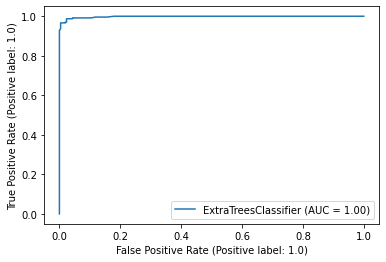

In [102]:
#Plotting ROC and Compare AUC for all the models used here
#This method is depressitated for the Sklearn in that purpose error are their 
#Below that one more code will be their 
from sklearn import datasets
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import roc_auc_score

disp = plot_roc_curve(ET, x_test, y_test) #ax_=Axes with confusion matrix
plot_roc_curve(RFC, x_test, y_test, ax = disp.ax)
plot_roc_curve(LR, x_test, y_test, ax = disp.ax)
plot_roc_curve(svc, x_test, y_test, ax = disp.ax)
plot_roc_curve(GB, x_test, y_test, ax = disp.ax)
plot_roc_curve(ABC, x_test, y_test, ax = disp.ax)
plot_roc_curve(BC, x_test, y_test, ax = disp.ax)

plt.legend(prop={'size':11}, loc = 'lower right')
plt.show()

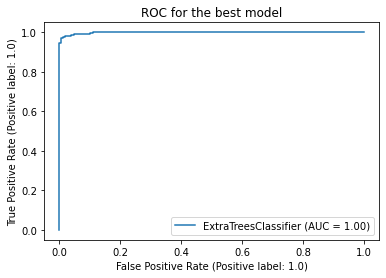

In [103]:
#lets check the AUC for the best model after hyper parameter tunning
plot_roc_curve(Final_model, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

Saving the model

In [104]:
#Saving the model
import joblib
joblib.dump(Final_model, "HR_Analytics.pkl")

['HR_Analytics.pkl']

Predicting the Saved model

In [105]:
#Lets load the saved model and get the predictions
model = joblib.load("HR_Analytics.pkl")

#prediction
prediction = model.predict(x_test)
prediction

array([0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0.,
       1., 0., 0., 1., 0., 0., 1., 1., 1., 1., 0., 1., 1., 0., 1., 1., 1.,
       0., 0., 1., 0., 1., 0., 1., 1., 1., 1., 0., 0., 0., 1., 0., 1., 1.,
       1., 1., 0., 1., 1., 1., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 0.,
       0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0.,
       0., 1., 1., 1., 0., 1., 1., 1., 0., 1., 1., 0., 1., 0., 1., 0., 1.,
       0., 1., 0., 1., 0., 1., 0., 0., 1., 1., 0., 0., 0., 1., 0., 1., 1.,
       0., 1., 0., 1., 1., 0., 0., 1., 0., 1., 1., 1., 0., 1., 1., 0., 1.,
       0., 0., 0., 1., 1., 0., 1., 1., 1., 0., 1., 1., 0., 1., 0., 0., 1.,
       0., 1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0.,
       0., 0., 1., 1., 0., 1., 1., 1., 0., 0., 1., 1., 0., 0., 1., 1., 1.,
       0., 1., 1., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 1., 1.,
       0., 0., 1., 1., 1., 1., 1., 1., 0., 0., 1., 0., 0., 0., 0., 1., 1.,
       1., 0., 0., 1., 0.

These are the predicted Attrition values of the customers.